#### PCA tomography on combined spectra

In [63]:
import json
from pca_cleaning import SpectralPCA
import matplotlib.pyplot as plt
import numpy as np
from astropy.io import fits
from astropy.table import Table
from astropy.wcs import WCS

In [64]:
with open("sci_files_object_mapping.json", "r") as f:
    sci_files_object_mapping = json.load(f)

import numpy as np
from astropy.io import fits
from astropy.wcs import WCS


def get_wl(filename, redshift):
    # Abrir o arquivo FITS e obter o cabeçalho e os dados
    header = fits.getheader(filename, ext=("sci", 1))
    data = fits.getdata(filename, ext=("sci", 1))

    # Criar o objeto WCS a partir do cabeçalho
    wcs = WCS(header, naxis=[1])

    # Obter o número de pixels na dimensão espectral (assumindo que está no eixo 1)
    num_pixels = data.shape[1]

    # Gerar a sequência de pixels e convertê-los para comprimentos de onda
    wavelength = wcs.wcs_pix2world(np.arange(num_pixels), 0)[0]

    # Aplicar a correção do redshift
    corrected_wl = wavelength / (1 + redshift)

    return corrected_wl

In [65]:
# This function is designed to aid the creation of a emission line mask.
# It plots the sum of all spectra and other 10 points of the IFU, showing where we are making cuts


def inspect_velocity_redshift_emission(
    source,
    wl,
    mdf,
    emission_lines: list,
    delta,
):
    beams = [408, 419, 69, 269, 469, 669, 658, 458, 258, 58]
    nbeamplots = len(beams)  # number of beams to plot
    nplots = (
        nbeamplots + 1
    )  # total number of plots is the number of beams selected + 1 (the first plot is the sum of all beams)
    plot_heigth = nplots * 5
    fig, ax = plt.subplots(
        nrows=nplots, ncols=1, figsize=(60, plot_heigth), sharex=False
    )

    # Define a granularidade de marcações no eixo x
    xticks = np.arange(wl.min(), wl.max(), 100)

    signal = np.nansum(source, axis=0)
    signal_mean = np.mean(signal)
    signal_std = np.std(signal)
    ax[0].plot(wl, np.clip(signal, None, signal_mean + 2.5 * signal_std))
    ax[0].set_title("Sum of all spectra")
    ax[0].set_xticks(xticks)

    # Make a lookup table from the MDF to know which row in the matrix represent each beam
    mdf_table = Table(mdf)
    source_mdf = mdf_table[mdf_table["BEAM"] == 1]
    target_beams_mdf = source_mdf[np.isin(source_mdf["NO"], beams)]

    for beam_seq, beam_id in enumerate(beams):
        beam_row_index = np.where(target_beams_mdf["NO"] == beam_id)[0]
        plot_index = beam_seq + 1
        ax[plot_index].plot(wl, source[beam_row_index].flatten())  # Garantir que é 1D
        ax[plot_index].set_title(f"Signal of beam {beam_id}")
        ax[plot_index].set_xticks(xticks)

    for line_wl in emission_lines:
        for figure in ax:
            figure.axvline(line_wl - delta, ls="dashed", color="red", lw=0.6)
            figure.axvline(line_wl + delta, ls="dashed", color="orange", lw=0.6)

    plt.show()

In [66]:
def emission_masker(input_signal, wl, emission_lines, delta_lambda):
    # Máscara para remover linhas de emissão do espectro
    masked_signal = np.copy(input_signal)
    for line in emission_lines:
        mask = (wl >= (line - delta_lambda)) & (wl <= (line + delta_lambda))
        masked_signal = np.where(mask, np.nan, masked_signal)

    return masked_signal


def inspect_velocity_redshift_absortion(
    source,
    wl,
    mdf,
    emission_lines,
    delta_lambda,
    absortion_windows,
    *args,
    **kwargs,
):
    beams = [408, 419, 69, 269, 469, 669, 658, 458, 258, 58]
    nbeamplots = len(beams)  # number of beams to plot
    nplots = (
        nbeamplots + 1
    )  # total number of plots is the number of beams selected + 1 (the first plot is the sum of all beams)
    plot_heigth = nplots * 5
    fig, ax = plt.subplots(
        nrows=nplots, ncols=1, figsize=(60, plot_heigth), sharex=True
    )

    signal = np.nansum(source, axis=0)
    masked_signal = emission_masker(signal, wl, emission_lines, delta_lambda)
    # ax[0].plot(wl, np.clip(masked_signal, None, None))
    ax[0].plot(wl, masked_signal)
    ax[0].set_title("Sum of all spectra")

    # Make a lookup table from the MDF to know which row in the matrix represent each beam
    mdf_table = Table(mdf)
    source_mdf = mdf_table[mdf_table["BEAM"] == 1]
    target_beams_mdf = source_mdf[np.isin(source_mdf["NO"], beams)]
    for beam_seq, beam_id in enumerate(beams):
        beam_row_index = np.where(target_beams_mdf["NO"] == beam_id)[0]
        plot_index = beam_seq + 1

        signal = source[beam_row_index].flatten()
        masked_signal = emission_masker(signal, wl, emission_lines, delta_lambda)
        ax[plot_index].plot(wl, masked_signal)
        ax[plot_index].set_title(f"Signal of beam {beam_id}")

    for abs_window in absortion_windows:
        for figure in ax:
            figure.axvline(abs_window[0], ls="dashed", color="black", lw=0.6)
            figure.axvline(abs_window[1], ls="dashed", color="gray", lw=0.6)

    plt.show()

In [77]:
def create_corrected_file(science, mdf, step_free_source, name):
    beam_mask = mdf["BEAM"] == -1
    source_mask = (mdf["BEAM"] == 1)[~beam_mask]
    sky_mask = (mdf["BEAM"] == 0)[~beam_mask]
    sky = science[sky_mask]

    sky_counter = 0
    source_counter = 0
    reconstructed_source = np.zeros(science.shape)
    for index, is_source in enumerate(source_mask):
        if is_source:
            reconstructed_source[index] = step_free_source[source_counter]
            source_counter += 1
        else:
            reconstructed_source[index] = sky[sky_counter]
            sky_counter += 1

    filename = f"redux/{name}_combined_spectra_ext.fits"
    new_filename = f"redux/{name}_pca_combined_spectra_ext.fits"
    with fits.open(filename) as hdul:
        hdul["SCI"].data = reconstructed_source
        hdul.writeto(new_filename, overwrite=True)
        print(f"corrected data saved at: {new_filename}")

### GSN 069

In [68]:
observed_absortion_windows = [
    (4124, 4150),
    (4282, 4317),
    (4370, 4421),
    (4515, 4592),
    (5028, 5050),
    (5070, 5135),
    (5161, 5193),
    (5247, 5287),
    (5314, 5354),
    (5390, 5417),
    (5698, 5722),
    (5938, 5995),
    (6050, 6073),
]

In [69]:
object_name = list(sci_files_object_mapping.keys())[0]
name = object_name.replace(" ", "").lower()
filename = f"redux/{name}_combined_spectra_ext.fits"
redshift = 0.018

with fits.open(filename) as hdul:
    science = hdul["SCI"].data
    mdf = hdul["MDF"].data

wl = get_wl(filename, redshift)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


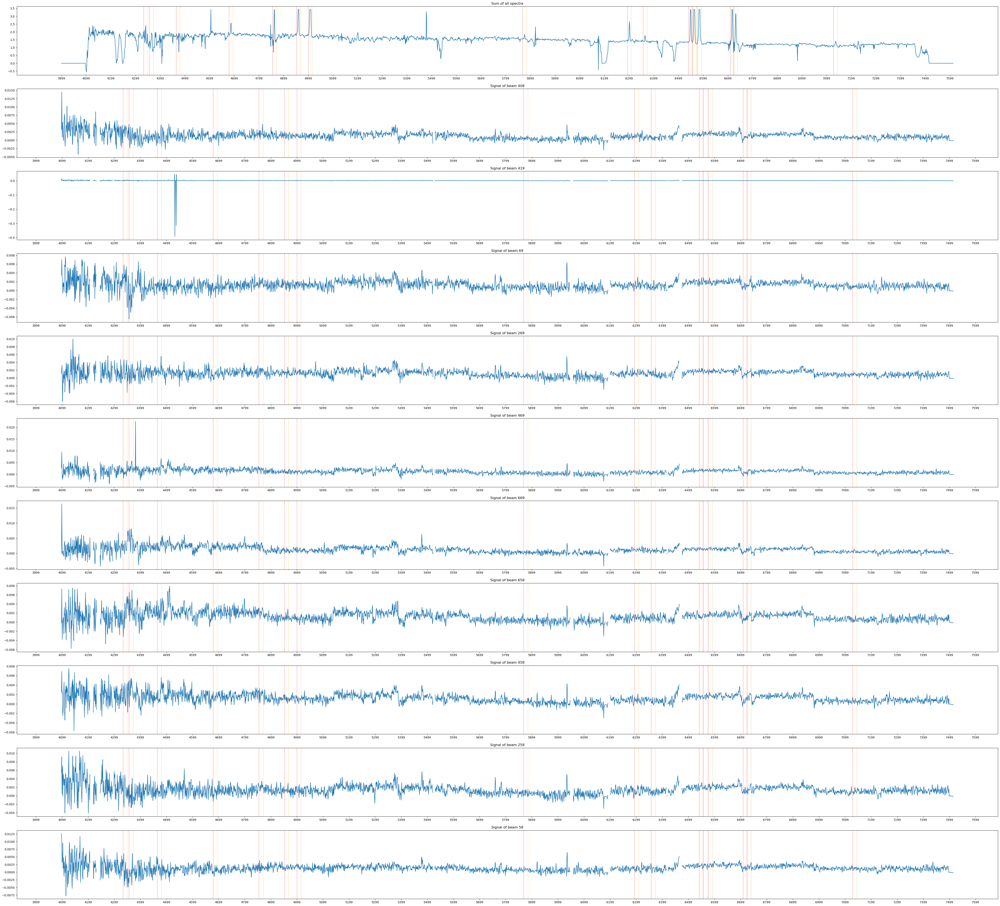

In [70]:
delta = 8

emission_lines = [
    4340.46,  # Hγ
    4363.21,  # [O III]
    4471.5,  # He I
    4685.68,  # He II
    4861.33,  # Hβ
    4958.91,  # [O III]
    5006.84,  # [O III]
    5875.6,  # He I
    6300.30,  # [O I]
    6363.78,  # [O I]
    6548.05,  # [N II]
    6562.79,  # Hα
    6583.45,  # [N II]
    6716.44,  # [S II]
    6730.82,  # [S II]
    7135.8,  # [Ar III]
]

inspect_velocity_redshift_emission(science, wl, mdf, emission_lines, delta)

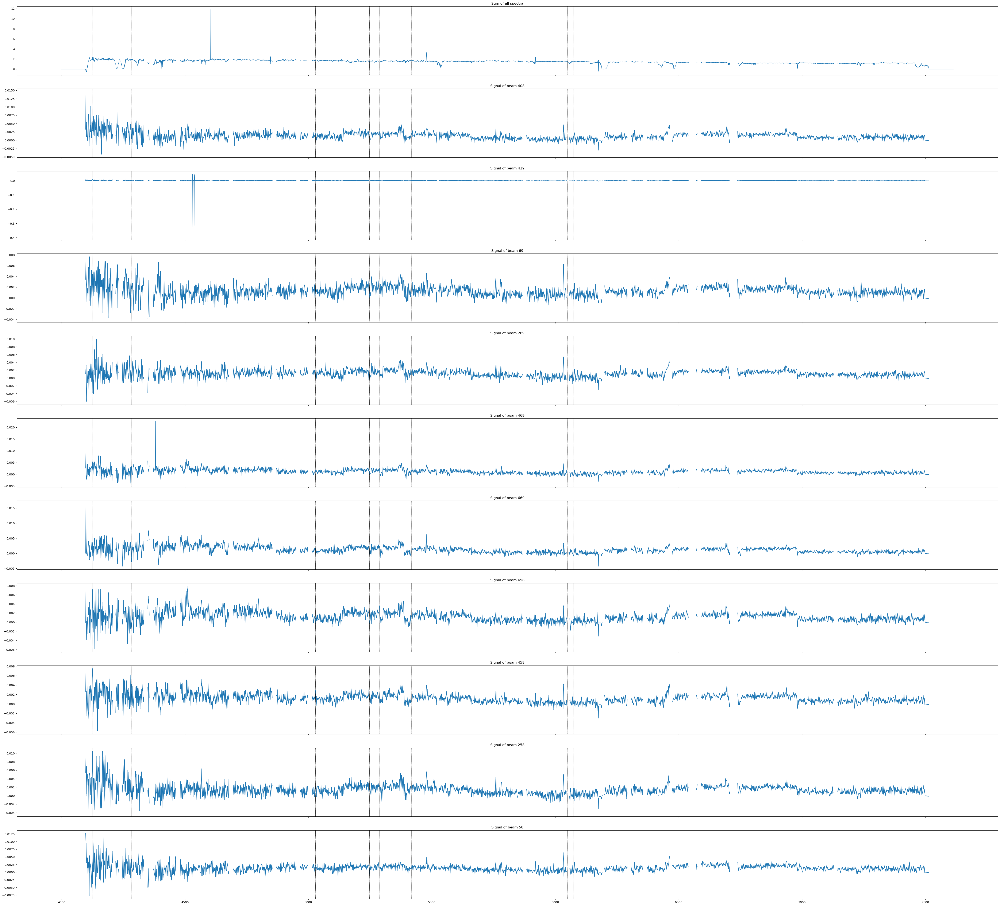

In [71]:
absortion_windows = [
    (4124, 4150),
    (4282, 4317),
    (4370, 4421),
    (4515, 4592),
    (5028, 5050),
    (5070, 5135),
    (5161, 5193),
    (5247, 5287),
    (5314, 5354),
    (5390, 5417),
    (5698, 5722),
    (5938, 5995),
    (6050, 6073),
]


inspect_velocity_redshift_absortion(
    science, wl, mdf, emission_lines, delta, absortion_windows
)

In [72]:
pca_selection_criteria = "selection_index"


data = SpectralPCA(
    filename,
    redshift,
    emission_lines,
    delta,
    observed_absortion_windows,
)


data.pca_decompose()


data.luminosity_component_correlation(pca_selection_criteria)

x2     17287.660969
x3       283.309247
x1       211.748397
x4        29.388102
x6         3.262554
x14        1.288931
x9         0.941719
x15        0.259246
x16        0.210103
x5         0.168130
x8         0.134833
x10        0.128251
x17        0.127610
x7         0.082233
x13        0.074800
x18        0.047702
x19        0.046076
x11        0.033550
x20        0.001258
x12        0.000244
Name: selection_index, dtype: float64


In [73]:
selection_threshold = 0.08
data.subtract_bad_components(selection_threshold)

Removing components: [12, 17, 18, 10, 19, 11]


In [74]:
stepfilter3 = data.StepSignalRemoval(3)
stepfilter3.calculate_and_subtract_step_signal(1726.965142774873, 3.25)
step_signal3 = stepfilter3.bad_signal

stepfilter2 = data.StepSignalRemoval(2)
stepfilter2.calculate_and_subtract_step_signal(1716.404884951783, 1.5)
step_signal2 = stepfilter2.bad_signal

stepfilter4 = data.StepSignalRemoval(4)
stepfilter4.calculate_and_subtract_step_signal(1703.75, 0)
step_signal4 = stepfilter4.bad_signal

stepfilter5 = data.StepSignalRemoval(5)
stepfilter5.calculate_and_subtract_step_signal(1703.75, 0)
step_signal5 = stepfilter5.bad_signal

stepfilter8 = data.StepSignalRemoval(8)
stepfilter8.calculate_and_subtract_step_signal(1694.375, 0)
step_signal8 = stepfilter8.bad_signal

step_total = step_signal2 + step_signal3 + step_signal4 + step_signal5 + step_signal8
step_free_source = data.noise_subtracted_source - step_total

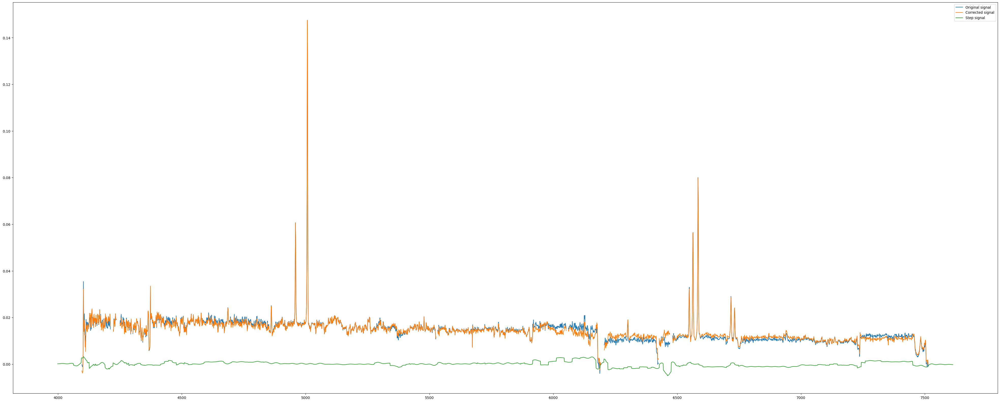

In [75]:
beam = 37
plt.figure(figsize=(50, 20))
plt.plot(
    data.corrected_wl,  # [: len(sythetic_data)],
    data.noise_subtracted_source[beam],  # [: len(sythetic_data)],
    label="Original signal",
)
plt.plot(
    data.corrected_wl,  # [: len(sythetic_data)],
    step_free_source[beam],  # [: len(sythetic_data)],
    label="Corrected signal",
)
plt.plot(
    data.corrected_wl,  # [: len(sythetic_data)],
    step_total[beam],  # [: len(sythetic_data)],
    label="Step signal",
)
plt.legend()

plt.show()

In [78]:
create_corrected_file(science, mdf, step_free_source, name)

corrected data saved at: redux/gsn069_pca_combined_spectra_ext.fits


### eRO-QPE2

In [79]:
object_name = list(sci_files_object_mapping.keys())[1]
name = object_name.replace(" ", "").lower()
filename = f"redux/{name}_combined_spectra_ext.fits"
redshift = 0.0175
delta = 8

with fits.open(filename) as hdul:
    science = hdul["SCI"].data
    mdf = hdul["MDF"].data

wl = get_wl(filename, redshift)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


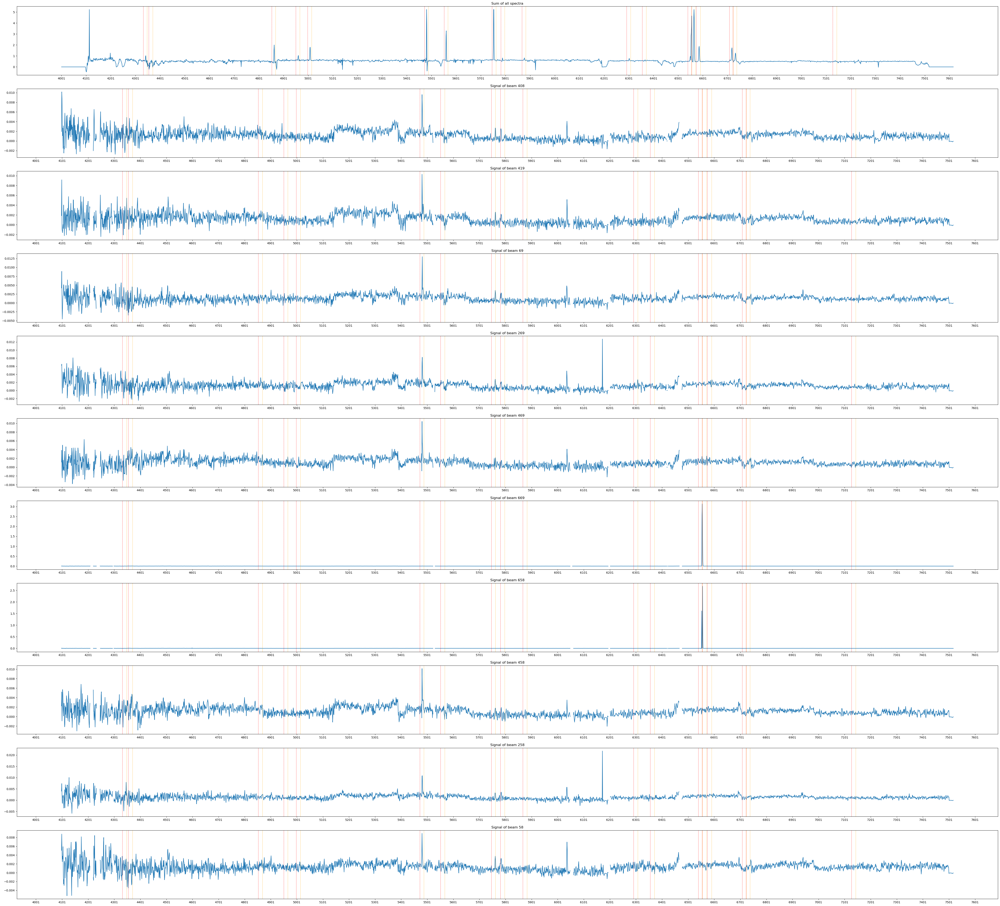

In [80]:
delta = 8

emission_lines = [
    4340.46,  # Hγ
    4363.21,  # [O III]
    4861.33,  # Hβ
    4958.91,  # [O III]
    5006.84,  # [O III]
    5480.5,  # [?]
    5560,
    5754.595,  # [N II]
    5790,
    5875.6,  # [He I]
    6300.30,  # [O I]
    6363.78,  # [O I]
    6548.05,  # [N II]
    6562.79,  # Hα
    6583.45,  # [N II]
    6716.44,  # [S II]
    6730.82,  # [S II]
    7135.8,  # [Ar III]
    # 7230,
]

inspect_velocity_redshift_emission(science, wl, mdf, emission_lines, delta)

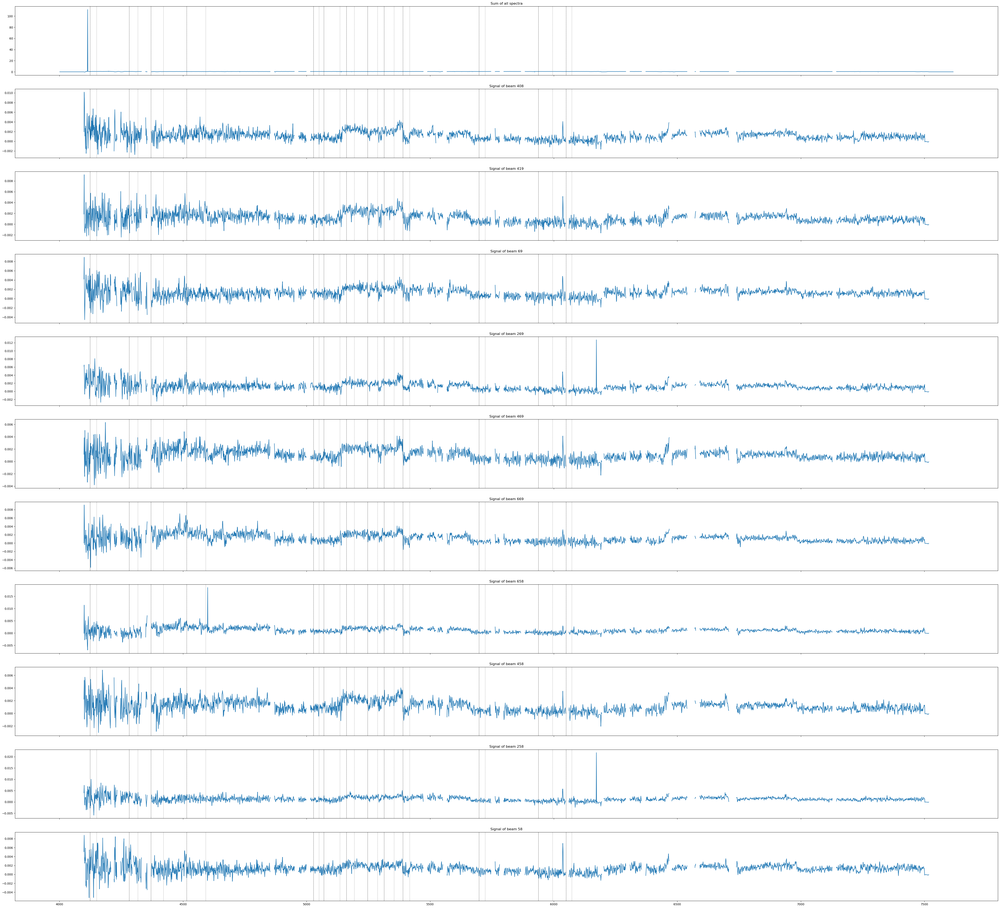

In [81]:
absortion_windows = [
    (4124, 4150),
    (4282, 4317),
    (4370, 4421),
    (4515, 4592),
    (5028, 5050),
    (5070, 5135),
    (5161, 5193),
    (5247, 5287),
    (5314, 5354),
    (5390, 5417),
    (5698, 5722),
    (5938, 5995),
    (6050, 6073),
]


inspect_velocity_redshift_absortion(
    science, wl, mdf, emission_lines, delta, absortion_windows
)